In [1]:
import cv2
import numpy as np
from superpoint.datasets.coco import Coco
from utils import plot_imgs

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
experiments = [
    'mp_synth-v6_photo-hom-aug_ha1-100-3-old_coco',
    
    
    'mp_synth-v5_aug_reg-001_estop-60000_coco',
#    'mp_synth-v5_aug_reg-001_estop-60000_ha1-100-3_coco',
    'mp_synth-v6_photo-hom-aug_ha1-100-3-old_coco',
    'mp_synth-v6_photo-hom-aug_ha1-100-0-persp_coco',
#    'mp_synth-v5_aug_reg-001_estop-60000_ha1-1000-10_coco',
]
names = ['No adaptation', 'Adaptation N=100', 'Adaptation N=1000']

In [3]:
configs = [{'labels': 'outputs/{}'.format(e), 'truncate': 15} for e in experiments]
datasets = [Coco(**c).get_test_set() for c in configs]

In [4]:
def draw_keypoints(img, corners, color=(0, 255, 0), radius=3, s=3):
    img = np.repeat(cv2.resize(img, None, fx=s, fy=s)[..., np.newaxis], 3, -1)
    for c in np.stack(corners).T:
        cv2.circle(img, tuple(s*np.flip(c, 0)), radius, color, thickness=-1)
    return img

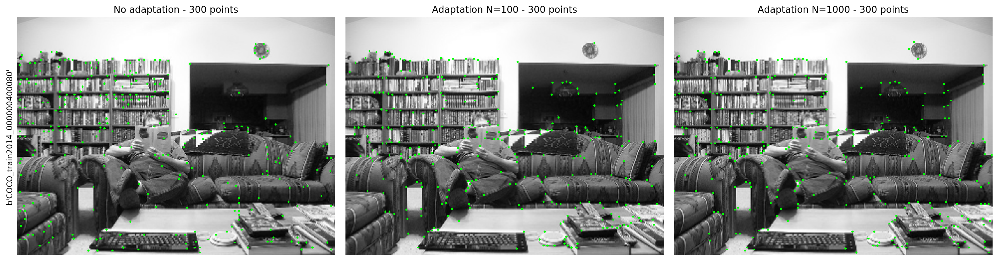

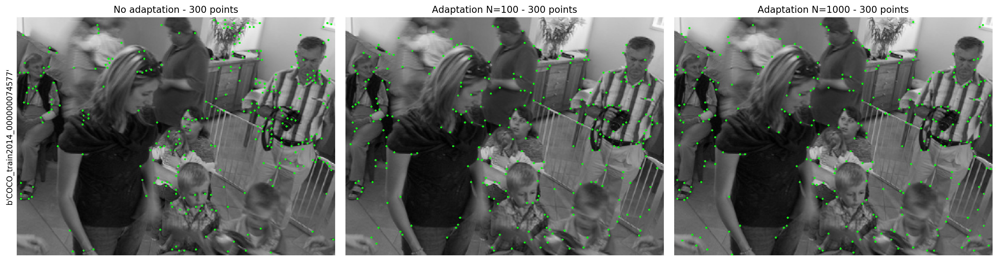

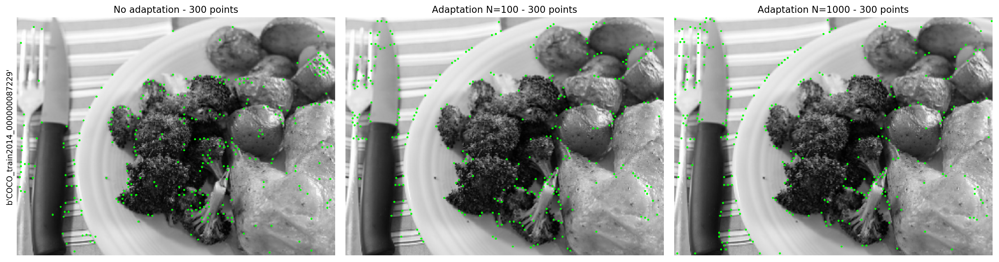

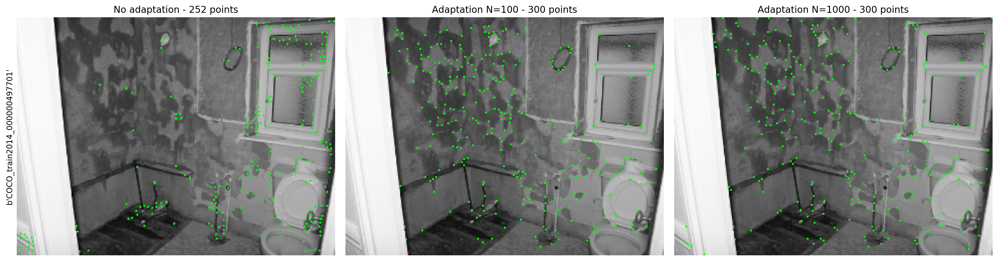

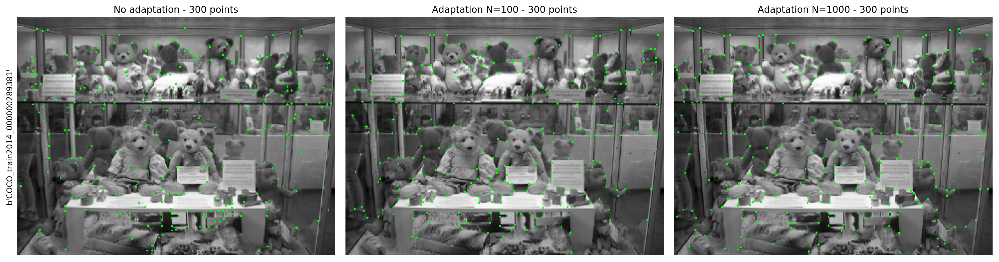

...

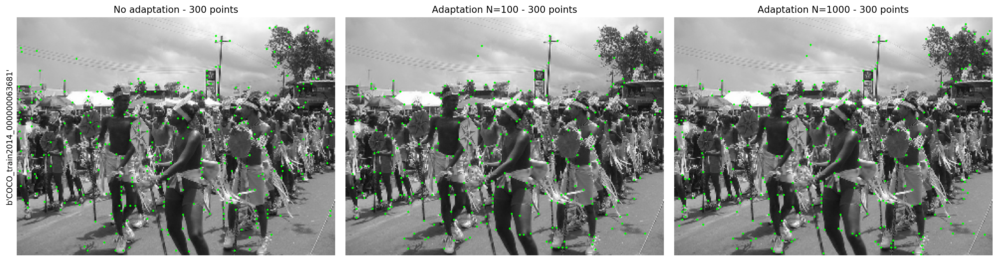

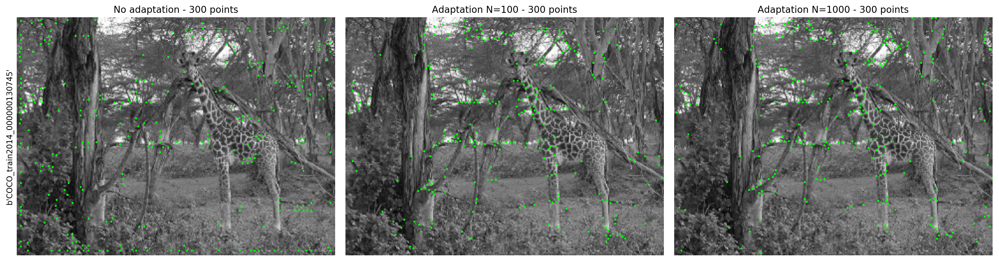

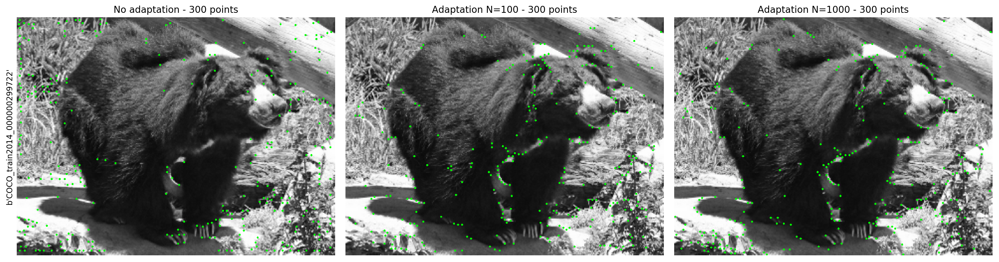

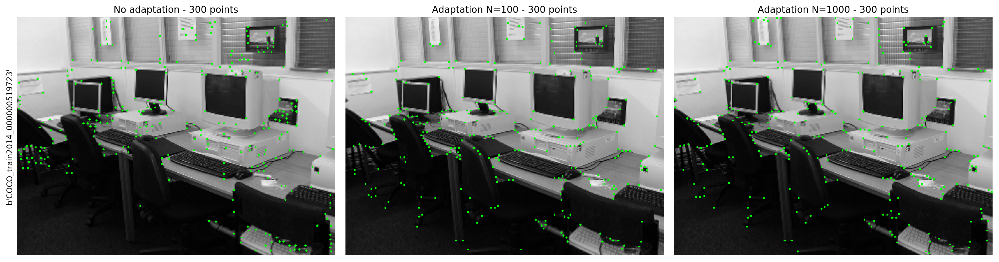

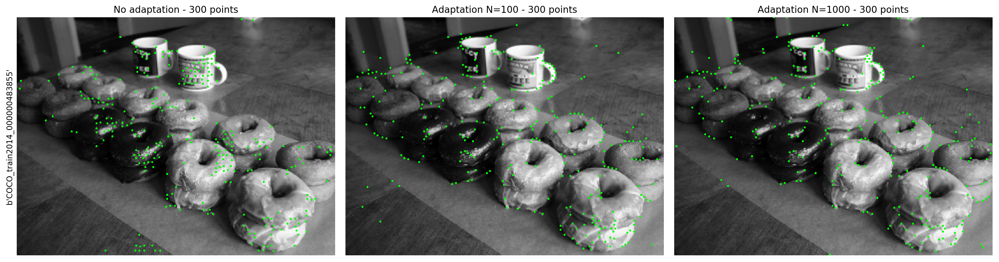

In [5]:
for i in range(15):
    images, titles = [], []
    for n, e, data in zip(names, experiments, datasets):
        d = next(data)
        images.append(draw_keypoints(d['image'] * 255, np.where(d['keypoint_map']))/255.)
        titles.append('{} - {} points'.format(n, len(d['keypoints'])))
    plot_imgs(images, titles=titles, ylabel=d['name'], dpi=200, cmap='gray')